# Exploration_10

## 1. Segmentation

### 1.1 Module

- 사용할 패키지를 설치합니다.  
- colab에서 pixellib의 설치 이슈가 있어 다른 환경에서 구동 후 다시 가져왔습니다.

In [1]:
import os
import cv2
import urllib
import tarfile
import numpy as np
from glob import glob
import tensorflow as tf
from os.path import join
from matplotlib import pyplot as plt

import pixellib
from pixellib.semantic import semantic_segmentation

### 1.2 Image

#### 1.2.1 Image Load

- 오늘 사용할 이미지를 불러옵니다.

In [ ]:
!pwd

/aiffel/aiffel/human_segmentation


- shape도 한번 찍어봅니다.

In [ ]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/image_009.png' # 사진이 저장된 경로 
img_orig = cv2.imread(img_path) 
print (img_orig.shape)

(684, 456, 3)


- image를 확인합니다.

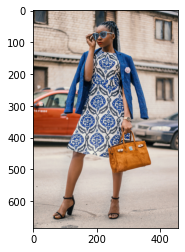

In [ ]:
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

- 핵인싸로 보여집니다.

### 1.3 Deeplab v3

#### 1.3.1 Model

- 오늘 사용할 model은 deeplab v3에서 pascal 데이터로 학습한 모델인 것으로 알고있습니다.  
- 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'  
에서 다운받을 수 있습니다.

In [ ]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

In [ ]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

- pascal 데이터는 2012년 대회용 데이터로 21개의 라벨이 있는 것으로 알고 있지만, labels을 찍어봅니다.

In [ ]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

- person은 15번입니다.

#### 1.3.2 Human Segmentation

- model이 준비한 이미지에서 핵인싸 누나의 영역을 잘 추출할 수 있을지 돌려봅니다.

In [ ]:
segvalues, output = model.segmentAsPascalvoc(img_path)

- output을 확인합니다.

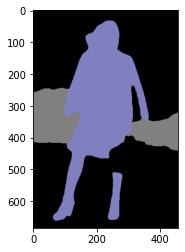

In [ ]:
plt.imshow(output)
plt.show()

- 이미지가 3개의 영역으로 구분됩니다.  
  검은 바탕은 배경으로 보이고, 회색은 원본 그림에서 보면 차로 보여집니다. 남은 하나는 사람입니다.

- segmentation value 값도 확인해봅니다.

In [ ]:
segvalues

{'class_ids': array([ 0, 15, 19]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

- segvalues 안에는 class_ids와 mask가 담겨있는데, id를 찍으면 구분한 name이 나올 것 같습니다.

In [ ]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
car
person


- 네 3개로 구분한 것을 확인할 수 있습니다.

- pixellib에서 어떤 color로 segmentation을 했는지 알아내야 합니다.  
알아 낸 후 해당 부분 컬러를 따로 mask를 하려합니다.

In [ ]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:21]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0],
       [  0,  64, 128]])

- 배경포함(0,0,0) 총 21개의 color 값이 존재합니다.  
- 사람은 15번이었습니다(LABEL_NAMES)

In [ ]:
colormap[15]

array([192, 128, 128])

- 처음엔 좀 헷갈렸는데 colormap은 RGB 순서입니다. (192, 128, 128)로 백날 컬러값 찾아도 안나옵니다.  
- BGR로 순서를 바꿔서 sge_color를 지정합니다.

In [ ]:
seg_color = (128,128,192)

- seg_color 값으로만 mask를 뽑아냅니다.

(684, 456)


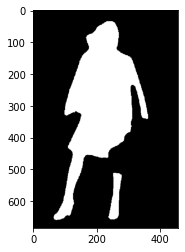

In [ ]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

- cv2.COLORMAP_JET은 OpenCV에서 제공하는 컬러맵입니다.  
- cv2.addWeight(img1, alpha, img2, beta, gamma)은 블렌딩에 사용합니다.  
addWeight 함수를 이용해서 가중치를 두고 두 이미지를 합칠 수 있습니다.

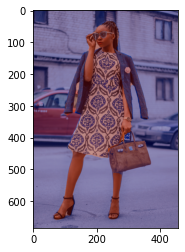

In [ ]:
img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

#### 1.3.3 Blurring

- 이번엔 원본을 복사한 이미지에 blurring을 해보겠습니다.
- cv2.blur의 (15,15)는 필터의 size입니다.  
  size를 바꿔가며 비교해보겠습니다.

1) Average Blur

- (15,15)

Blur


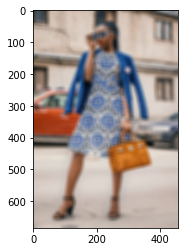

In [ ]:
img_orig_blur = cv2.blur(img_orig, (15,15))  

print('Blur')
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

- (5,5)

Blur 5,5


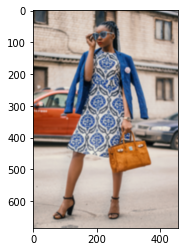

In [ ]:
img_orig_blur1_1 = cv2.blur(img_orig, (5,5))  

print('Blur 5,5')
plt.imshow(cv2.cvtColor(img_orig_blur1_1, cv2.COLOR_BGR2RGB))
plt.show()

- (30,30)

Blur 30,30


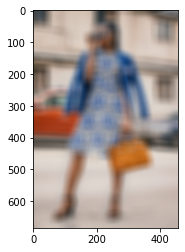

In [ ]:
img_orig_blur1_2 = cv2.blur(img_orig, (30,30))  

print('Blur 30,30')
plt.imshow(cv2.cvtColor(img_orig_blur1_2, cv2.COLOR_BGR2RGB))
plt.show()

- 필터의 size가 커질수록 blurring의 정도도 더 강해집니다.

2) Gaussian Blur

- 이번에는 GaussianBlur입니다.  
중앙의 픽셀 위치에 따라 가중치가 다르게 적용됩니다.  
표준편차를 의미하는 인자 하나를 더 가져옵니다.

Gaussian Blur


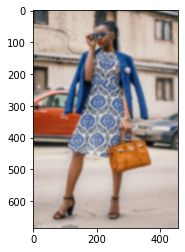

In [ ]:
img_orig_blur2 = cv2.GaussianBlur(img_orig, (15,15),0)  

print('Gaussian Blur')
plt.imshow(cv2.cvtColor(img_orig_blur2, cv2.COLOR_BGR2RGB))
plt.show()

3) Median Blur

- MedianBlur입니다.  
커널 크기를 인자로 받아오며, 커널 크기 내의 픽셀의 중간 값으로 blurring을 합니다. 

Median Blur


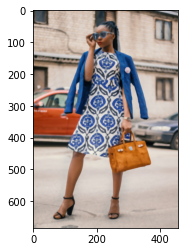

In [ ]:
img_orig_blur3 = cv2.medianBlur(img_orig, 5)  

print('Median Blur')
plt.imshow(cv2.cvtColor(img_orig_blur3, cv2.COLOR_BGR2RGB))
plt.show()

- 그냥 기본 blur의 (20,20)size가 맘에듭니다...  
- 생성한 mask를 이용해서 배경만 추출합니다.


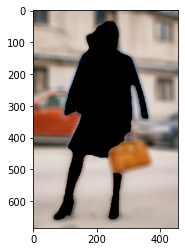

In [ ]:
img_orig_blur = cv2.blur(img_orig, (20,20))  

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

- mask의 255(검은색) 부분의 이미지만 가저와 blur처리한 이미지와 합쳐줍니다. 

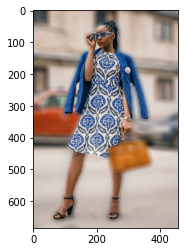

In [ ]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 생각보다 블러가 강해서 mask가 얇게 떠진 부분은 blurring된 것처럼 보입니다.
- 나름 만족스럽습니다.

#### 1.3.4 Image Concatrate

- 이번에는 segmentation 작업 후 다른 image에 붙여넣겠습니다.

- segmentation을 진행할 iamge를 불러옵니다.

(684, 456, 3)


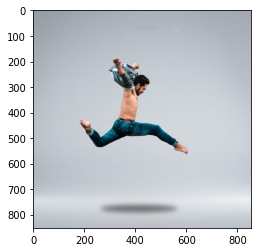

In [ ]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/image_022.png'
img_orig_2 = cv2.imread(img_path)
print (img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig_2, cv2.COLOR_BGR2RGB))
plt.show()

- 이미 한번 해본 작업이므로 빠르게 진행합니다.

In [ ]:
segvalues, output = model.segmentAsPascalvoc(img_path)

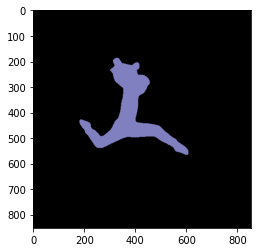

In [ ]:
plt.imshow(output)
plt.show()

In [ ]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


- 잘 뽑았습니다. 사람과 배경뿐입니다.

(852, 852)


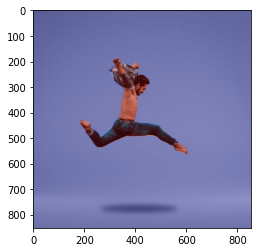

In [ ]:
seg_color = (128,128,192)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)

img_show = img_orig_2.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

- 사람 부분만 masking합니다.

In [ ]:
img_mask_up = cv2.resize(img_mask, img_orig_2.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)
_, img_mask_up = cv2.threshold(img_mask_up, 128, 255, cv2.THRESH_BINARY)

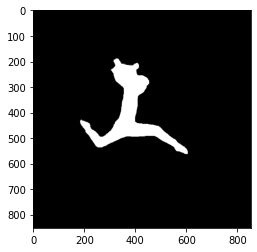

In [ ]:
plt.imshow(img_mask_up, cmap=plt.cm.binary_r)
plt.show()

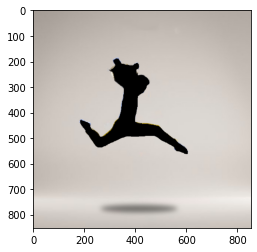

In [ ]:
img_mask_color = cv2.cvtColor(img_mask_up, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg = cv2.bitwise_and(img_orig_2, img_bg_mask) # 이미지 비트에 대해 and 연산
plt.imshow(img_bg)
plt.show()

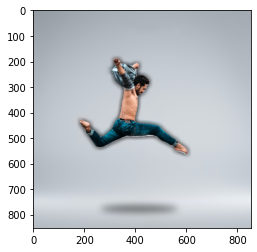

In [ ]:
img_bg_blur = cv2.blur(img_bg, (30,30))
img_concat = np.where(img_mask_color==255, img_orig_2, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 배경 자체가 단색이라 blurring이 티가 잘 안납니다.

- 이번에는 합칠 배경을 불러봅니다.  
이 점프를 스튜디오가 아닌 해변의 백사장에서 할 수 있게 해주려합니다.

(1280, 1920, 3)


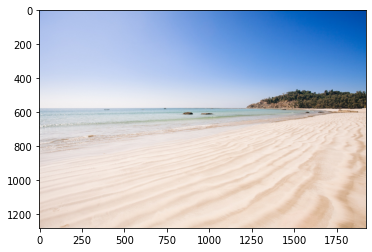

In [ ]:
img_path_2 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_030.png'
img_sea = cv2.imread(img_path_2) 
print (img_sea.shape)

plt.imshow(cv2.cvtColor(img_sea, cv2.COLOR_BGR2RGB))
plt.show()

- image의 size 차이가 있으므로 resize 후 합쳐줍니다.

In [ ]:
target_size = img_orig_2.shape[:2][::-1]
resized_sea = cv2.resize(img_sea, target_size)
print(resized_sea.shape)

(852, 852, 3)


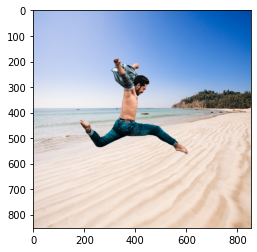

In [ ]:
img_concat = np.where(img_mask_color==255, img_orig_2, resized_sea)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 이미 아시겠지만, 저는 이 사진이 맘에 안 듭니다...  
 배경 resizing에서 비율을 맘대로 줄여버렸습니다.  
 이게 깔끔한 해변이었기에 망정이지 사물이었으면 꼴 보기 싫었을 겁니다.

#### 1.3.5 Resizing Method

- resize를 굳이 하는 이유는 size가 다르면 array 형태로 합쳐줄 때 broadcast를 수행할 수 없기 때문입니다.  
- shape을 찍어봅니다.

In [ ]:
print(img_sea.shape)
print(img_orig_2.shape)

(1280, 1920, 3)
(852, 852, 3)


1) background cut
- 배경이 깔끔하니 필요한 부분만 잘라서 사용해보는 방법입니다.  
- 두 이미지의 size만 맞으면 상관 없으니 필요한 부분의 축만 잘라서 사용합니다.

In [ ]:
img_sea_cut = img_sea[200:1052,748:1600,:3]

- 결국 잘라서 (852, 851, 3)만 만들어주면 끝입니다.

In [ ]:
print(img_sea_cut.shape)

(852, 852, 3)


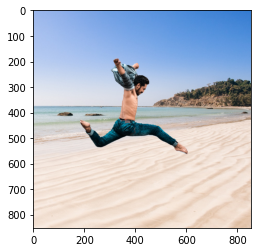

In [ ]:
img_concat = np.where(img_mask_color==255, img_orig_2, img_sea_cut)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 전체 배경이 다 들어가지 못해 아쉽지만 왜곡은 피했습니다.

2) background scale down and cut

- 가로, 세로의 왜곡을 줄이면서 최대한 배경을 많이 가져가고 싶습니다.
- 배경의 비율을 x축, y축 동일하게 0.7 수준으로 맞춰 줄여줍니다.

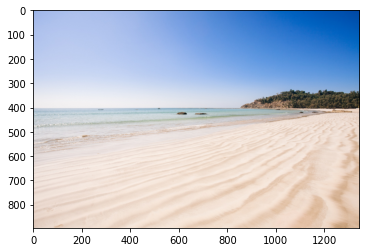

In [ ]:
img_sea_resized = cv2.resize(img_sea, dsize=(0, 0), fx=0.7, fy=0.7, interpolation=cv2.INTER_AREA)
plt.imshow(cv2.cvtColor(img_sea_resized, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
print(img_sea_resized.shape)

(896, 1344, 3)


- 대충 mask이미지와 비슷해졌습니다.  
이제 broadcast를 수행하기 위해 잘라줍니다.

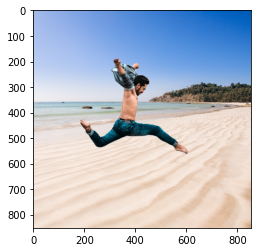

In [ ]:
img_sea_resized = img_sea_resized[44:896,400:1252,:3]
img_concat = np.where(img_mask_color==255, img_orig_2, img_sea_resized)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 최대한 배경 image를 살려볼 수 있습니다.

3) image make border

- 이번 과정에서는 좀 다른 사진을 쓰겠습니다.  
배경이 깔끔하니 왜곡이 잘 안 보입니다.  
- 고급 스포츠카 앞에서 짜증부리는 고양이를 표현해봅니다.

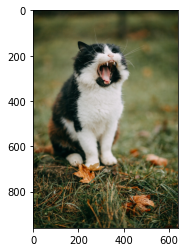

In [ ]:
img_path_3 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_031.png'
img_orig_3 = cv2.imread(img_path_3)

plt.imshow(cv2.cvtColor(img_orig_3, cv2.COLOR_BGR2RGB))
plt.show()

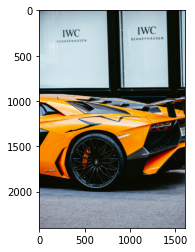

In [ ]:
bg_img_path_3 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_032.png'
bg_img_orig_3 = cv2.imread(bg_img_path_3)

plt.imshow(cv2.cvtColor(bg_img_orig_3, cv2.COLOR_BGR2RGB))
plt.show()

- 앞 과정과 동일합니다.

In [ ]:
segvalues, output = model.segmentAsPascalvoc(img_path_3)

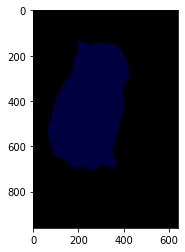

In [ ]:
plt.imshow(output)
plt.show()

In [ ]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


(960, 640)


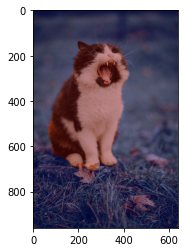

In [ ]:
seg_color = (0,0,64)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)

img_show = img_orig_3.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
img_mask_up = cv2.resize(img_mask, img_orig_3.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)
_, img_mask_up = cv2.threshold(img_mask_up, 128, 255, cv2.THRESH_BINARY)

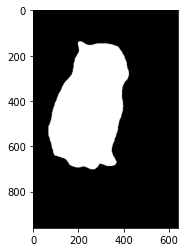

In [ ]:
plt.imshow(img_mask_up, cmap=plt.cm.binary_r)
plt.show()

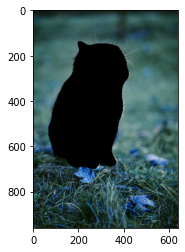

In [ ]:
img_mask_color = cv2.cvtColor(img_mask_up, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg = cv2.bitwise_and(img_orig_3, img_bg_mask) # 이미지 비트에 대해 and 연산
plt.imshow(img_bg)
plt.show()

In [ ]:
print(img_orig_3.shape)
print(bg_img_orig_3.shape)

(960, 640, 3)
(2400, 1604, 3)


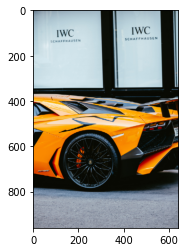

In [ ]:
bg_img_orig_resized = cv2.resize(bg_img_orig_3, dsize=(0, 0), fx=0.4, fy=0.4, interpolation=cv2.INTER_AREA)
plt.imshow(cv2.cvtColor(bg_img_orig_resized, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
print(img_orig_3.shape)
print(bg_img_orig_resized.shape)

(960, 640, 3)
(960, 642, 3)


- 배경과 mask 이미지를 합칩니다.

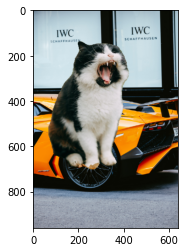

In [ ]:
bg_img_orig_resized = bg_img_orig_resized[0:960,0:640,:3]
img_concat = np.where(img_mask_color==255, img_orig_3, bg_img_orig_resized)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 딱 봐도 이상합니다. 저는 이런 이미지 싫습니다.  
사람들이 생각하는 보편적인 고양이 비율을 가져가고 싶습니다...

- 위에서는 배경을 조절했는데 이번에는 masking 할 이미지를 늘려보면 어떨까요?
- 다시 불러옵니다.

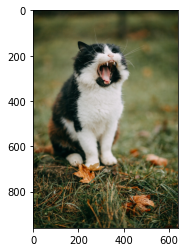

In [ ]:
img_path_3 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_031.png'
img_orig_3 = cv2.imread(img_path_3)

plt.imshow(cv2.cvtColor(img_orig_3, cv2.COLOR_BGR2RGB))
plt.show()

- 열심히 googling해서 padding 효과처럼 사용할 cv2.copyMakeBorder를 찾았습니다.
- cv2.BORDER_REPLICATE로 border의 마지막 값을 그대로 늘려줍니다.  
 물론 크기는 배경으로 들어갈 image와 맞춰줍니다(상하좌우 값에 따라 고양이의 대략적인 위치까지 지정할 수 있습니다)


(2400, 1604, 3)


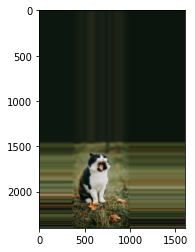

In [ ]:
img_orig_3_3 = cv2.copyMakeBorder(img_orig_3,1440,0,360,604,cv2.BORDER_REPLICATE)

print(img_orig_3_3.shape)
plt.imshow(cv2.cvtColor(img_orig_3_3, cv2.COLOR_BGR2RGB))
plt.show()

- model이 path를 기준으로 array형태로 읽어옵니다.   
저장 후 다시 불러옵니다.

In [ ]:
new_img_path = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_031_new.png'
cv2.imwrite(new_img_path, img_orig_3_3)

True

(2400, 1604, 3)


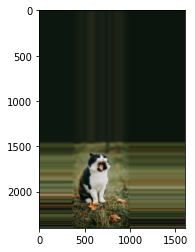

In [ ]:
new_img_path = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_031_new.png'
img_orig_3 = cv2.imread(new_img_path)

print(img_orig_3.shape)
plt.imshow(cv2.cvtColor(img_orig_3, cv2.COLOR_BGR2RGB))
plt.show()

- 위치가 좋네요.
- 다시 이전 작업을 진행합니다.

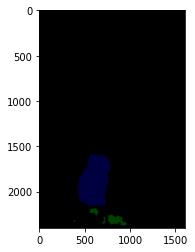

In [ ]:
segvalues, output = model.segmentAsPascalvoc(new_img_path)

plt.imshow(output)
plt.show()

(2400, 1604)


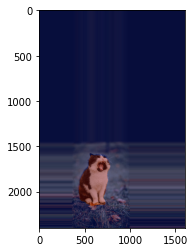

In [ ]:
seg_color = (0,0,64)
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)

img_show = img_orig_3.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
img_mask_up = cv2.resize(img_mask, img_orig_3.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)
_, img_mask_up = cv2.threshold(img_mask_up, 128, 255, cv2.THRESH_BINARY)

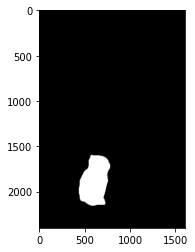

In [ ]:
plt.imshow(img_mask_up, cmap=plt.cm.binary_r)
plt.show()

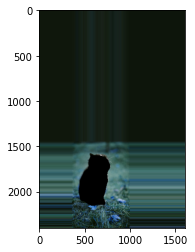

In [ ]:
img_mask_color = cv2.cvtColor(img_mask_up, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg = cv2.bitwise_and(img_orig_3, img_bg_mask) # 이미지 비트에 대해 and 연산
plt.imshow(img_bg)
plt.show()

- 합쳐줍니다.

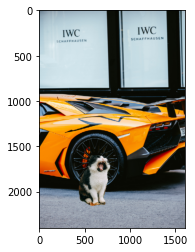

In [ ]:
img_concat = np.where(img_mask_color==255, img_orig_3, bg_img_orig_3)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 이제 좀 편안해집니다.  
- 여기서 고양이 비율을 더 줄이고싶으면 masking할 원본 이미지를 x,y축 동일한 비율로 축소하고 makeborder로 늘려주면 좋을 것 같습니다.

In [ ]:
new_img_path_3 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_037_new.png'
cv2.imwrite(new_img_path_3, img_concat)

True

### 1.4 Segmentation Compare

- 대표적인 모델들을 비교해보려 합니다.
- 총 4장의 image로 비교합니다.

#### 1.4.1 Pixellib_Deeplab v3

- 비교할 이미지에 segmentation masking만 진행한 상태로 저장합니다.

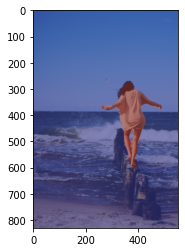

In [ ]:
img_path_4 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_008.png'
img_orig_4 = cv2.imread(img_path_4)

segvalues, output = model.segmentAsPascalvoc(img_path_4)

seg_color = (128,128,192)
seg_map = np.all(output==seg_color, axis=-1)

img_show = img_orig_4.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
new_img_path_4 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_008_mask.png'
cv2.imwrite(new_img_path_4, img_show)

True

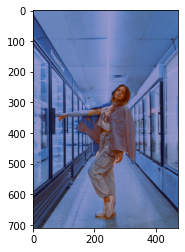

In [ ]:
img_path_5 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_011.png'
img_orig_5 = cv2.imread(img_path_5)

segvalues, output = model.segmentAsPascalvoc(img_path_5)

seg_color = (128,128,192)
seg_map = np.all(output==seg_color, axis=-1)

img_show = img_orig_5.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

new_img_path_5 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_011_mask.png'
cv2.imwrite(new_img_path_5, img_show)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

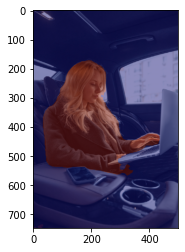

In [ ]:
img_path_6 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_019.png'
img_orig_6 = cv2.imread(img_path_6)

segvalues, output = model.segmentAsPascalvoc(img_path_6)

seg_color = (128,128,192)
seg_map = np.all(output==seg_color, axis=-1)

img_show = img_orig_6.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

new_img_path_6 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_019_mask.png'
cv2.imwrite(new_img_path_6, img_show)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

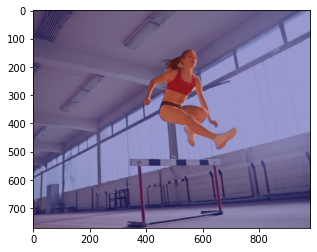

In [ ]:
img_path_7 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_004.png'
img_orig_7 = cv2.imread(img_path_7)

segvalues, output = model.segmentAsPascalvoc(img_path_7)

seg_color = (128,128,192)
seg_map = np.all(output==seg_color, axis=-1)

img_show = img_orig_7.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

new_img_path_7 = os.getenv('HOME')+ '/aiffel/human_segmentation/images/image_004_mask.png'
cv2.imwrite(new_img_path_7, img_show)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

#### 1.4.2 Detectron2

- 마찬가지로 이미지에 segmentation masking만 진행한 상태로 저장합니다.

In [1]:
!pip install imantics
!pip install git+https://github.com/facebookresearch/fvcore.git
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for imantics: filename=imantics-0.1.12-py3-none-any.whl size=16033 sha256=5c8da5ce17ad5371ec57716d5c510871a87b1c10f664ef681369c830590c106b
  Stored in directory: /root/.cache/pip/wheels/da/7c/3e/296fe3ed4eb3bd713e91dee0d0549f12f316d49939a64bdc96
Successfully built imantics
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-eipf205t
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-eipf205t
     |████████████████████████████████| 596 kB 4.2 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5-py3-none-any.whl size=65176 sha256=863ccf6bbca0527a370b05ff4a8ca5cc0367f43c99e9069f728593f6b7ffe984
  Stored in directory: /tmp/pip-ephem-wheel-cache-dnzzsi73/wheels/24/1d/09/8167de727fe5b74f832b6fcb5d9069d8f03c

In [30]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [2]:
# !pip install remo

In [3]:
# !python -m remo_app init --colab

In [31]:
# import remo
import pandas as pd
import numpy as np
from PIL import Image
import glob
import os, json, cv2, random
from google.colab.patches import cv2_imshow

from imantics import Polygons, Mask

import torch, torchvision

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [32]:
img_1 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/New/image_004.jpg')
img_2 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/New/image_008.jpg')
img_3 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/New/image_011.jpg')
img_4 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/New/image_019.jpg')

In [33]:
cfg = get_cfg()

In [34]:
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model

# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)

In [43]:
outputs = predictor(img_1)

tensor([0], device='cuda:0')
Boxes(tensor([[380.9109, 136.9667, 716.5344, 500.6692]], device='cuda:0'))


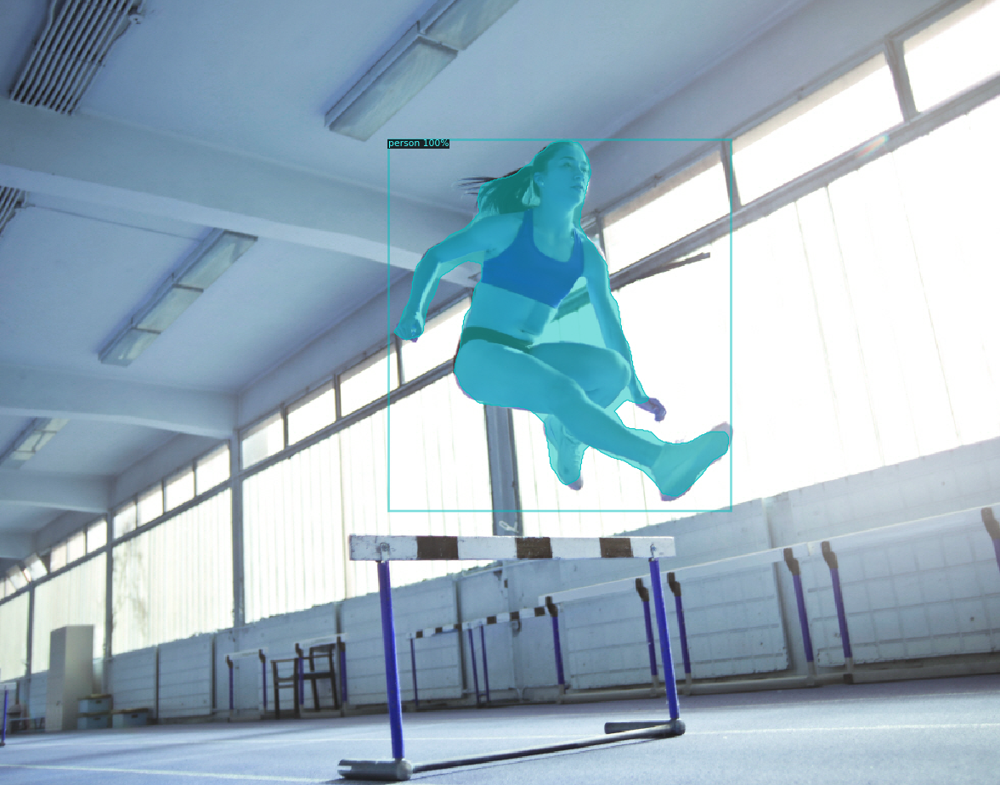

In [44]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

v = Visualizer(img_1[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image())
# cv2_imshow("image", out.get_image()[:, :, ::-1])
# cv2_imshow(cv2.resize(img_1, (800, 600)))
# cv2.imshow("image", out.get_image()[:, :, ::-1])

cv2.waitKey(0)
cv2.destroyAllWindows()

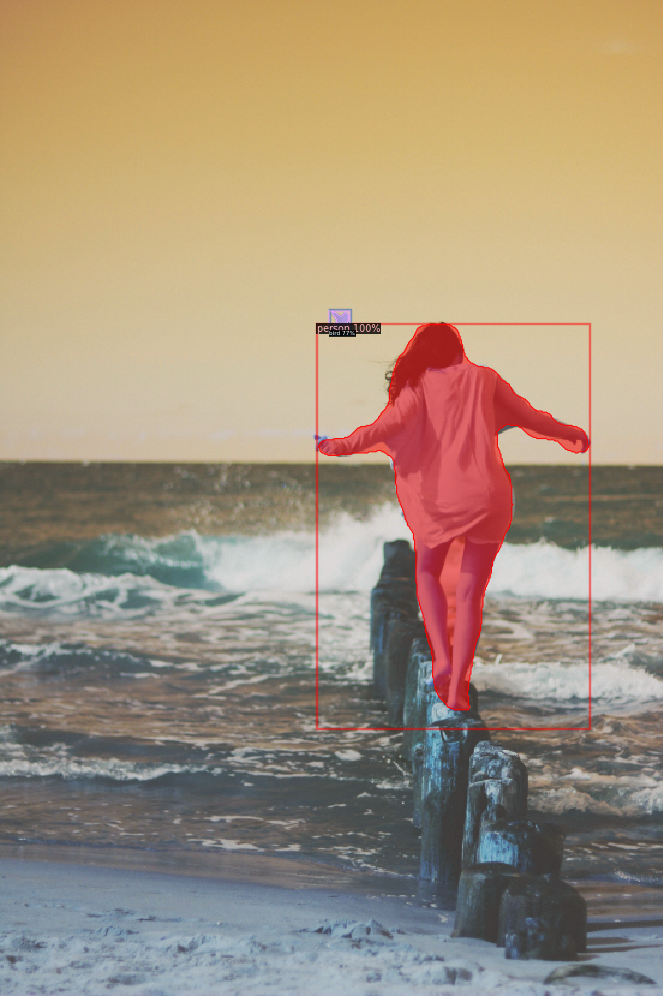

In [45]:
outputs = predictor(img_2)

v = Visualizer(img_2[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image())
# cv2_imshow("image", out.get_image()[:, :, ::-1])
# cv2_imshow(cv2.resize(img_1, (800, 600)))
# cv2.imshow("image", out.get_image()[:, :, ::-1])

cv2.waitKey(0)
cv2.destroyAllWindows()

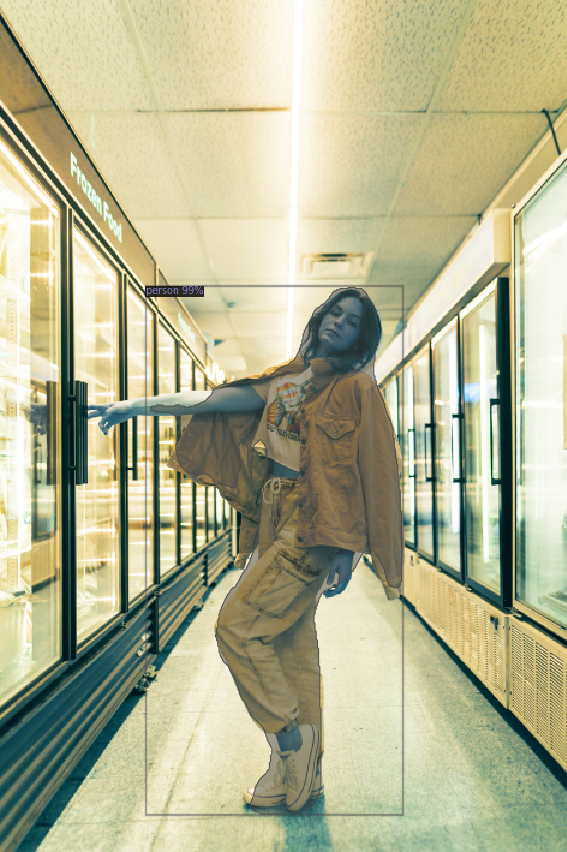

In [46]:
outputs = predictor(img_3)

v = Visualizer(img_3[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image())
# cv2_imshow("image", out.get_image()[:, :, ::-1])
# cv2_imshow(cv2.resize(img_1, (800, 600)))
# cv2.imshow("image", out.get_image()[:, :, ::-1])

cv2.waitKey(0)
cv2.destroyAllWindows()

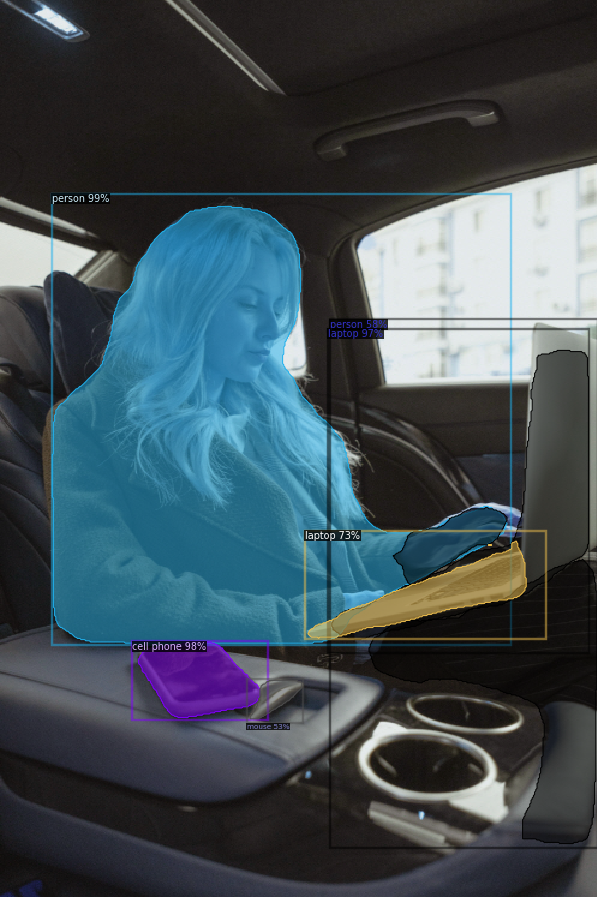

In [47]:
outputs = predictor(img_4)

v = Visualizer(img_4[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image())
# cv2_imshow("image", out.get_image()[:, :, ::-1])
# cv2_imshow(cv2.resize(img_1, (800, 600)))
# cv2.imshow("image", out.get_image()[:, :, ::-1])

cv2.waitKey(0)
cv2.destroyAllWindows()

#### 1.4.3 MediaPipe

- 마찬가지로 비교할 이미지에 segmentation masking만 진행한 상태로 저장합니다.

In [1]:
!pip install mediapipe

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 32.8 MB 1.2 MB/s 


In [2]:
import cv2
from google.colab.patches import cv2_imshow
import math
import numpy as np
from google.colab import files
import mediapipe as mp

In [3]:
uploaded = files.upload()

Saving image_004.png to image_004.png


In [24]:
DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480
def resize_and_show(image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  cv2_imshow(img)

# Read images with OpenCV.
images = {name: cv2.imread(name) for name in uploaded.keys()}
# Preview the images.
for name, image in images.items():
  print(name)   
  # resize_and_show(image)

image_004.png


In [25]:
mp_selfie_segmentation = mp.solutions.selfie_segmentation

Segmentation mask of image_004.png:


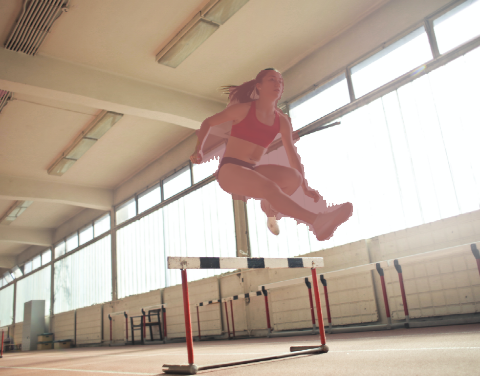

In [27]:
BG_COLOR = (192, 192, 192) # gray
MASK_COLOR = (128, 128, 210) # white

with mp_selfie_segmentation.SelfieSegmentation() as selfie_segmentation:
  for name, image in images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Selfie Segmentation.
    # results = selfie_segmentation.process(cv2.applyColorMap(image, cv2.COLOR_BGR2RGB))
    results = selfie_segmentation.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    # cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
    
    # Generate solid color images for showing the output selfie segmentation mask.
    fg_image = np.zeros(image.shape, dtype=np.uint8)
    fg_image[:] = MASK_COLOR
    # bg_image = np.zeros(image.shape, dtype=np.uint8)
    # bg_image[:] = BG_COLOR
    condition = np.stack((results.segmentation_mask,) * 3, axis=-1) > 0.2
    fg_image = cv2.addWeighted(image, 0.3, fg_image, 0.5, 0.0)
    output_image = np.where(condition, fg_image, image)

    print(f'Segmentation mask of {name}:')
    resize_and_show(output_image)

In [28]:
uploaded = files.upload()

Saving image_008.png to image_008.png


In [33]:
def resize_and_show(image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  cv2_imshow(img)

# Read images with OpenCV.
images = {name: cv2.imread(name) for name in uploaded.keys()}
# Preview the images.
for name, image in images.items():
  print(name)   
  # resize_and_show(image)

image_008.png


Segmentation mask of image_008.png:


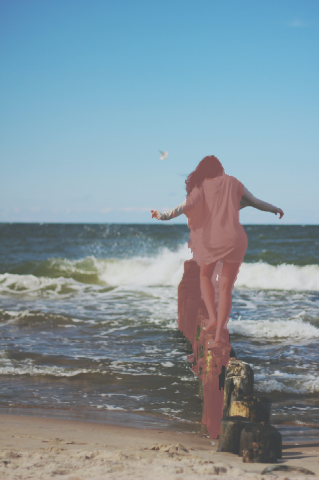

In [31]:
BG_COLOR = (192, 192, 192) # gray
MASK_COLOR = (128, 128, 210) # white

with mp_selfie_segmentation.SelfieSegmentation() as selfie_segmentation:
  for name, image in images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Selfie Segmentation.
    results = selfie_segmentation.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Generate solid color images for showing the output selfie segmentation mask.
    fg_image = np.zeros(image.shape, dtype=np.uint8)
    fg_image[:] = MASK_COLOR
    condition = np.stack((results.segmentation_mask,) * 3, axis=-1) > 0.2
    fg_image = cv2.addWeighted(image, 0.3, fg_image, 0.5, 0.0)
    output_image = np.where(condition, fg_image, image)

    print(f'Segmentation mask of {name}:')
    resize_and_show(output_image)

In [34]:
uploaded = files.upload()

Saving image_011.png to image_011.png


In [35]:
def resize_and_show(image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  cv2_imshow(img)

# Read images with OpenCV.
images = {name: cv2.imread(name) for name in uploaded.keys()}
# Preview the images.
for name, image in images.items():
  print(name)   
  # resize_and_show(image)

image_011.png


Segmentation mask of image_011.png:


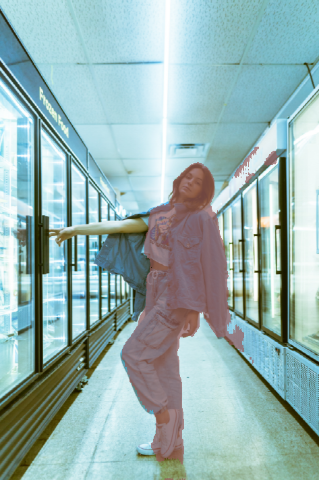

In [36]:
BG_COLOR = (192, 192, 192) # gray
MASK_COLOR = (128, 128, 210) # white

with mp_selfie_segmentation.SelfieSegmentation() as selfie_segmentation:
  for name, image in images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Selfie Segmentation.
    results = selfie_segmentation.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Generate solid color images for showing the output selfie segmentation mask.
    fg_image = np.zeros(image.shape, dtype=np.uint8)
    fg_image[:] = MASK_COLOR
    condition = np.stack((results.segmentation_mask,) * 3, axis=-1) > 0.2
    fg_image = cv2.addWeighted(image, 0.3, fg_image, 0.5, 0.0)
    output_image = np.where(condition, fg_image, image)

    print(f'Segmentation mask of {name}:')
    resize_and_show(output_image)

In [37]:
uploaded = files.upload()

Saving image_019.png to image_019.png


In [38]:
def resize_and_show(image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  cv2_imshow(img)

# Read images with OpenCV.
images = {name: cv2.imread(name) for name in uploaded.keys()}
# Preview the images.
for name, image in images.items():
  print(name)   
  # resize_and_show(image)

image_019.png


Segmentation mask of image_019.png:


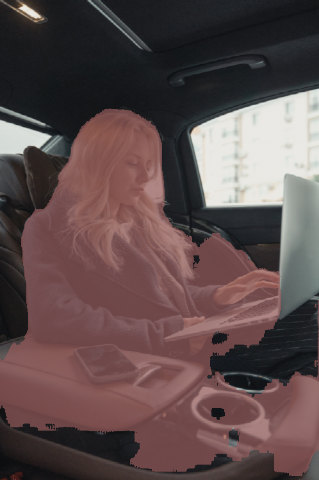

In [39]:
BG_COLOR = (192, 192, 192) # gray
MASK_COLOR = (128, 128, 210) # white

with mp_selfie_segmentation.SelfieSegmentation() as selfie_segmentation:
  for name, image in images.items():
    # Convert the BGR image to RGB and process it with MediaPipe Selfie Segmentation.
    results = selfie_segmentation.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Generate solid color images for showing the output selfie segmentation mask.
    fg_image = np.zeros(image.shape, dtype=np.uint8)
    fg_image[:] = MASK_COLOR
    condition = np.stack((results.segmentation_mask,) * 3, axis=-1) > 0.2
    fg_image = cv2.addWeighted(image, 0.3, fg_image, 0.5, 0.0)
    output_image = np.where(condition, fg_image, image)

    print(f'Segmentation mask of {name}:')
    resize_and_show(output_image)

#### 1.4.4 Compare

- 4개의 이미지를 가로로 합쳤습니다.  
왼쪽부터 Original, Pixellib, Detectron2, Mediapipe 순서입니다.

In [21]:
from google.colab.patches import cv2_imshow
from google.colab import drive

In [2]:
drive.mount('/gdrive')

Mounted at /gdrive


In [17]:
img_1 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_004/image_004.png')
img_2 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_004/image_004_mask.png')
img_3 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_004/image_004_mask(Detectron2).png')
img_4 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_004/image_004_mask(Mediapipe).png')

1) image_004

- 모델의 우측에 빛이 강하게 들어오는 사진으로 진행했습니다.

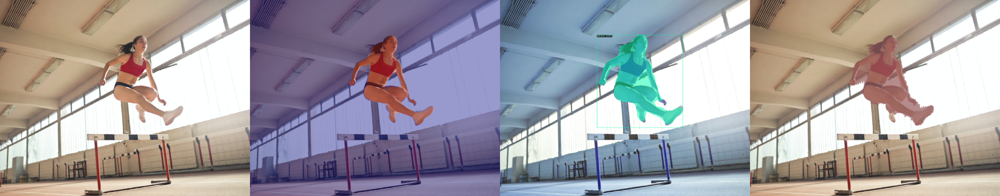

In [22]:
hstack = np.hstack((img_1, img_2, img_3, img_4))
cv2_imshow(hstack)

- 다른 model에 비해 Pixellib이 매우 정확하게 뽑았습니다.  
Pixellib : 왼발의 신발 하단, 왼쪽 허벅지 일부, 왼팔 겨드랑이 부분이 조금 아쉽습니다.  
Detectron2 : 왼쪽 복부 측면의 빈 공간을 전부 masking했습니다.  
Mediapipe : 총체적 난국입니다.

2) image_008

- 얼굴이 있는 앞모습이 아닌 사람 형상위주로 판단하기 위해 이미지를 준비했습니다.

In [25]:
img_1 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_008/image_008.png')
img_2 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_008/image_008_mask.png')
img_3 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_008/image_008_mask(Detectron2).png')
img_4 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_008/image_008_mask(Mediapipe).png')

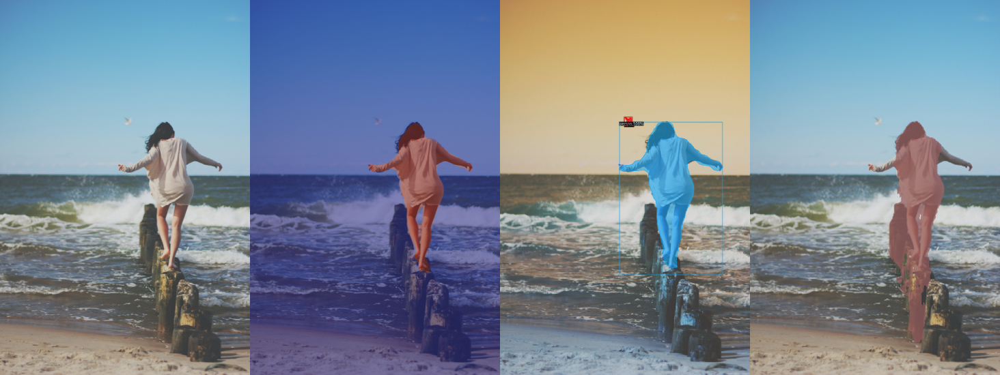

In [26]:
hstack = np.hstack((img_1, img_2, img_3, img_4))
cv2_imshow(hstack)

- 역시 Pixellib이 매우 정확하게 뽑았습니다.  
Pixellib : 양쪽 허벅지부터 종아리 사이의 공간을 정확히 구분했습니다.  
Detectron2 : 다리를 통으로 잡아낸 것이 아쉽습니다. 눈에 잘 안보이는 새를 잡아냈습니다.  
Mediapipe : 총체적 난국입니다 x 2

3) image_011

- 일반적인 자연광이 아닌 청색빛의 실내등을 배경으로 한 이미지를 준비했습니다.

In [27]:
img_1 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_011/image_011.png')
img_2 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_011/image_011_mask.png')
img_3 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_011/image_011_mask(Detectron2).png')
img_4 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_011/image_011_mask(Mediapipe).png')

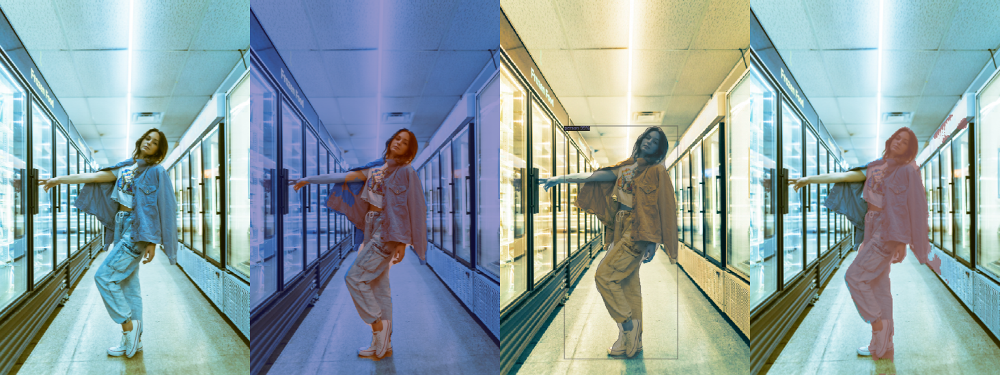

In [28]:
hstack = np.hstack((img_1, img_2, img_3, img_4))
cv2_imshow(hstack)

- 이번에는 Detecton2도 괜찮은 결과를 보여줍니다.  
Pixellib : 신발부터 발목 사이의 부분을 sharp하게 처리해준 부분이 맘에듭니다만 팔을 잘라먹습니다.  
Detectron2 : 그나마 팔을 덜 잘라먹고 손과 옷의 경계부분을 잡으려 노력했습니다.  
Mediapipe : 총체적 난국입니다 x 3

4) image_019

- 과하지 않은, 조금 어두운 차 안 이미지를 준비했습니다.

In [29]:
img_1 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_019/image_019.png')
img_2 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_019/image_019_mask.png')
img_3 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_019/image_019_mask(Detectron2).png')
img_4 = cv2.imread('/gdrive/My Drive/Colab Notebooks/image/resized/image_019/image_019_mask(Mediapipe).png')

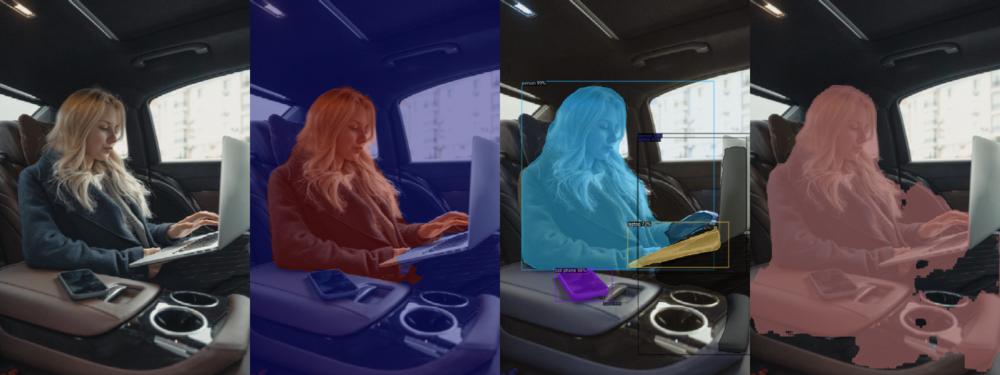

In [30]:
hstack = np.hstack((img_1, img_2, img_3, img_4))
cv2_imshow(hstack)

- Detecron2와 Pixellib가 잘 뽑아냅니다.  
Pixellib : 최대한 사람의 라인을 살려서 뽑아내는 것이 맘에듭니다.  
Detectron2 : 오른쪽 어깨의 옷자락이 조금 잘리지만 stuff를 %까지 써서 잘 구분합니다.   
Mediapipe : 그만 알아봅니다.

## 2. Retrospect

##### 1) version 문제
 - model마다 버전을 맞추는 작업이 매우 어렵습니다.  
 특히 pixellib 은 google colab 에서 구동이 어려워 다른 환경에서 구동 후 ipynb 파일만 저장하여 사용했습니다.  
 이 외 각 모듈별로 tensor 등의 버전이 각각 달라 런타임을 해제, 패키지 설치를 반복했습니다.

##### 2) Human Segmentation
 - 생각보다 사람을 segmentation 하는 기술의 발전이 더딘 것 같습니다.  
 깨끗하게 구분하는 pretrained 된 model을 찾기 어렵습니다.  
 Pascal dataset 의 지원도 2012년이 마지막인 것 같습니다.  
 다만 사람이 아닌 전체적인 object를 segmentation 하는 기술은 나날이 발전하는 것 같습니다.   
 이쪽이 더 사업적으로 적용 가능성이 높아서 그렇지 않을까 생각해봅니다. 

##### 3) OpenCV 함수
 - OpenCV 함수를 다양하게 많이 봐둬야겠습니다.  
 생각보다 할 수 있는 부분들이 많은데 아이디어만 있고 함수를 몰라 적용 못하는 경우가 있을 수 있겠다는 생각이 듭니다.  
 시간이 날 때마다 많이 봐둬야겠습니다.

##### 4) paperswithcode
 - paperswithcode에 좋은 정보들이 많아 자주 찾아볼 필요가 있을 것 같습니다.    
   특히 아래 페이지 상위권에 랭크된 EfficientNet 모델을 사용해보고 싶었는데 시간이 없어 넘어갑니다.  
    
 https://paperswithcode.com/sota/semantic-segmentation-on-pascal-voc-2012-val?p=auto-deeplab-hierarchical-neural-architecture

##### 5) semantic segmentation mask의 오류
 - segmentation mask의 정확도를 높이기 위해서는 많은 양의 dataset으로 train 하는 부분이 필요할 것 같다.  
 오늘 다뤄본 모델의 pascal 데이터셋도 2012년의 데이터셋으로 학습한 것으로 알고있는데  
 더 많은 데이터셋을 통해 정확도를 높이는 방법이 필요하다고 생각한다.  
 - 특히 더 좋은 솔루션을 사용하는 것이 좋겠다 Facebook의 pointraend 같은...  
 https://medium.com/syncedreview/facebook-pointrend-rendering-image-segmentation-f3936d50e7f1

## 3. References

- 아래의 사이트에서 많은 도움을 받았습니다.

1) Pascal

- https://paperswithcode.com/sota/semantic-segmentation-on-pascal-voc-2012-val?p=auto-deeplab-hierarchical-neural-architecture  
- http://host.robots.ox.ac.uk/pascal/VOC/voc2012/

2) Detectron2

- https://paperswithcode.com/lib/detectron2
- https://github.com/facebookresearch/detectron2
- https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
- https://colab.research.google.com/github/rediscovery-io/remo-python/blob/master/examples/google-colab/tutorial_pytorch_instance_segmentation.ipynb#scrollTo=VrzA6mcJdRQ0

3) MediaPipe

- https://github.com/google/mediapipe

4) Deeplab V3

- https://arxiv.org/abs/1706.05587
- https://github.com/tensorflow/models/tree/master/research/deeplab
- https://pytorch.org/vision/stable/generated/torchvision.models.segmentation.deeplabv3_resnet101.html
- https://colab.research.google.com/github/tensorflow/models/blob/master/research/deeplab/deeplab_demo.ipynb#scrollTo=aUbVoHScTJYe

5) cv2 function

- https://docs.opencv.org/4.x/d1/dfb/intro.html
- https://m.blog.naver.com/PostView.naver?isHttpsRedirect=true&blogId=shwotjd14&logNo=221309550659
- https://bkshin.tistory.com/entry/OpenCV-9-%EC%9D%B4%EB%AF%B8%EC%A7%80-%EC%97%B0%EC%82%B0
- https://webnautes.tistory.com/1255

6) ADE20K

- https://groups.csail.mit.edu/vision/datasets/ADE20K/

7) PointRend

- https://medium.com/syncedreview/facebook-pointrend-rendering-image-segmentation-f3936d50e7f1